# Figure - Batch size series

In [1]:
import os
work_dir = "H:/workspace/ptyrad_paper"
os.chdir(work_dir)
print("Current working dir: ", os.getcwd())

Current working dir:  H:\workspace\ptyrad_paper


In [2]:
import numpy as np
import matplotlib.pyplot as plt
from ptyrad.load import load_hdf5, load_ptyrad
from ptyrad.utils.image_proc import center_crop

In [3]:
batch_sizes = [1,4,16,64,256,1024]

ptyrad_objects = []
ptyshv_objects = []
py4dstem_objects = []

ptyrad_times = []
ptyshv_times = []
py4dstem_times = []

for i, batch_size in enumerate(batch_sizes):
    # Note that py4DSTEM has the 3 deg rotation, while these ptyrad and ptyshv results do not have the scan rotation as I did for the convergence test
    path_ptyrad   = f"03_output/tBL_WSe2/20250604_ptyrad_batch_sizes/full_N16384_dp128_flipT100_random{batch_size}_p6_1obj_6slice_dz2_Adam_plr1e-4_oalr5e-4_oplr5e-4_slr5e-4_orblur0.5_ozblur1_oathr0.98_oposc_sng1.0_spr0.1_aff1_0_-3_0/model_iter0100.hdf5"
    path_ptyshv   = f"03_output/tBL_WSe2/20250606_ptyshv_batch_sizes/roi1_Ndp128_step128/MLs_L1_p6_g{batch_size}_pc1_noModel_mm_Ns6_dz2_reg1_dpFlip_ud_T/Niter100.mat"
    path_py4dstem = f"03_output/tBL_WSe2/20250604_py4DSTEM_batch_sizes/N16384_dp128_flipT100_random{batch_size}_p6_6slice_dz2_update0.5_kzf1/model_iter0100.hdf5"

    # ptyrad
    ckpt_ptyrad = load_ptyrad(path_ptyrad)
    object_ptyrad = center_crop(ckpt_ptyrad['optimizable_tensors']['objp'].squeeze().sum(0), 384, 384)
    time_ptyrad = ckpt_ptyrad['avg_iter_t']
    
    # ptyshv
    ckpt_ptyshv = load_hdf5(path_ptyshv)
    object_ptyshv = center_crop(np.angle(ckpt_ptyshv['object']).sum(0).T, 384, 384)
    time_ptyshv = ckpt_ptyshv['outputs']['avgTimePerIter'].item()
    
    # py4DSTEM
    ckpt_py4dstem = load_hdf5(path_py4dstem)
    object_py4dstem = center_crop(np.angle(ckpt_py4dstem['object']).sum(0), 384, 384)
    time_py4dstem = ckpt_py4dstem['iter_times'].mean().item()

    ptyrad_objects.append(object_ptyrad)
    ptyshv_objects.append(object_ptyshv)
    py4dstem_objects.append(object_py4dstem)
    ptyrad_times.append(time_ptyrad)
    ptyshv_times.append(time_ptyshv)
    py4dstem_times.append(time_py4dstem)

Success! Loaded .hdf5 file as a dict from path = '03_output/tBL_WSe2/20250604_ptyrad_batch_sizes/full_N16384_dp128_flipT100_random1_p6_1obj_6slice_dz2_Adam_plr1e-4_oalr5e-4_oplr5e-4_slr5e-4_orblur0.5_ozblur1_oathr0.98_oposc_sng1.0_spr0.1_aff1_0_-3_0/model_iter0100.hdf5'
Detected data.shape = (6, 614, 614) with data.dtype = [('real', '<f8'), ('imag', '<f8')]. Casting back to 'complex128'.
Detected data.shape = (6, 128, 128) with data.dtype = [('real', '<f8'), ('imag', '<f8')]. Casting back to 'complex128'.
Success! Loaded .hdf5 file as a dict from path = '03_output/tBL_WSe2/20250606_ptyshv_batch_sizes/roi1_Ndp128_step128/MLs_L1_p6_g1_pc1_noModel_mm_Ns6_dz2_reg1_dpFlip_ud_T/Niter100.mat'
Success! Loaded .hdf5 file as a dict from path = '03_output/tBL_WSe2/20250604_py4DSTEM_batch_sizes/N16384_dp128_flipT100_random1_p6_6slice_dz2_update0.5_kzf1/model_iter0100.hdf5'
Success! Loaded .hdf5 file as a dict from path = '03_output/tBL_WSe2/20250604_ptyrad_batch_sizes/full_N16384_dp128_flipT100_ra

## Plotting 3x6 (horizontal layout)

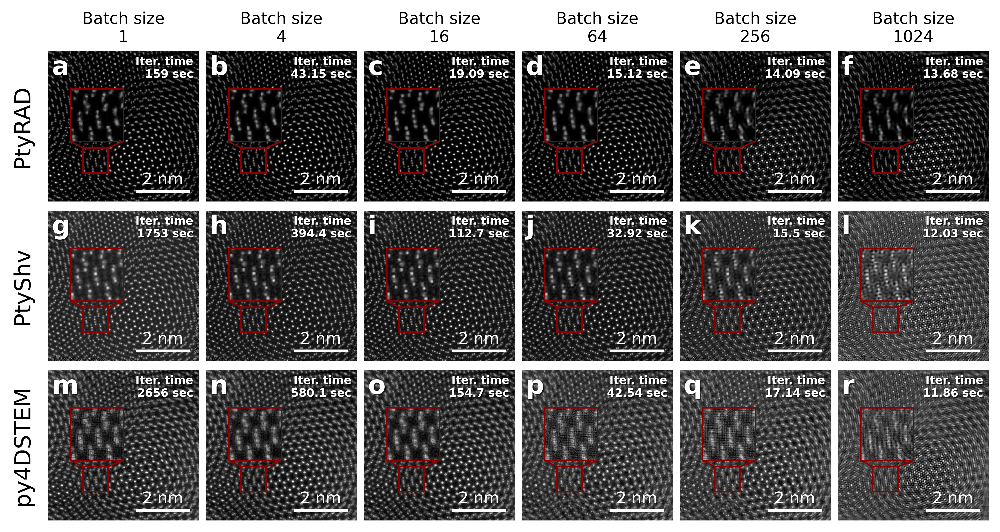

In [4]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from mpl_toolkits.axes_grid1.anchored_artists import AnchoredSizeBar
import matplotlib.font_manager as fm

# Method titles
titles = ['PtyRAD', 'PtyShv', 'py4DSTEM']

# Iter times
times = [ptyrad_times, ptyshv_times, py4dstem_times]

# Sequential panel labels, row-wise across 3 rows × 6 columns
panel_labels = np.array(list("abcdefghijklmnopqr")).reshape(3, 6)
shadow_offset = (3, 3)

# Zoom-in region
zoom_region = (88, 152, 310, 246)

# Define figure and GridSpec layout: 3 rows × 6 columns
fig = plt.figure(figsize=(10.5, 5.3), dpi=600)
gs = gridspec.GridSpec(3, 6, wspace=0.05, hspace=0.05, figure=fig)

# Iterate over methods and batch sizes
for row, (obj_set, time, title) in enumerate(zip([ptyrad_objects, ptyshv_objects, py4dstem_objects], times, titles)):
    for col in range(6):  # 6 batch sizes
        ax = fig.add_subplot(gs[row, col])

        # Main image
        vmin, vmax = np.percentile(obj_set[col], [0.5, 99.9])
        ax.imshow(obj_set[col], cmap='gray', origin='upper', vmin=vmin, vmax=vmax)
        ax.axis('off')

        # Add batch size title at top of each column
        if row == 0:
            ax.set_title(f"Batch size\n{batch_sizes[col]}", fontsize=10)

        # Add method label on leftmost column
        if col == 0:
            ax.annotate(title, xy=(-0.1, 0.5), xycoords='axes fraction',
                        fontsize=14, ha='right', va='center', rotation=90)

        # Panel label
        label = panel_labels[row, col]
        ax.text(9 + shadow_offset[0], 9 + shadow_offset[1], label, color='black',
                fontsize=16, fontweight='bold', va='top', ha='left', alpha=0.6)
        ax.text(9, 9, label, color='white', fontsize=16, fontweight='bold', va='top', ha='left')
        
        # Iter time label
        time_str = f'Iter. time\n {time[col]:.4g} sec'
        ax.text(370 + shadow_offset[0], 12 + shadow_offset[1], time_str, color='black', 
                fontsize=7, fontweight='bold', va='top', ha='right', alpha=0.6)
        ax.text(370, 12, time_str, color='white', fontsize=7, fontweight='bold', ha='right', va='top')

        # Scale bar
        scale_bar_length = 134
        scale_bar_label = "2 nm"
        fontprops = fm.FontProperties(size=10)
        scalebar = AnchoredSizeBar(ax.transData, scale_bar_length, scale_bar_label, loc='lower right',
                                   pad=0.5, color='white', frameon=False, size_vertical=3, label_top=True,
                                   fontproperties=fontprops)
        ax.add_artist(scalebar)

        # Inset zoom
        x1, x2, y1, y2 = zoom_region
        axins = ax.inset_axes([0.15, 0.40, 0.35, 0.35], xlim=(x1, x2), ylim=(y1, y2))
        axins.imshow(obj_set[col], cmap='gray', origin='upper', vmin=vmin, vmax=vmax)
        axins.tick_params(left=False, bottom=False, labelleft=False, labelbottom=False)
        for spine in axins.spines.values():
            spine.set_edgecolor('darkred')
        mark_inset(ax, axins, loc1=3, loc2=4, fc="none", ec="darkred")

plt.savefig("05_figures/Fig_S04_batch_size_series.pdf", bbox_inches="tight")
plt.show()
